# Assignment 5 (Intro to Deep learning)

Course: Introduction to machine learning

Instructor: Dr. Saber Saleh

Deadline: 98/11/05

**Shahab Rahimirad**

**95104663** 





You should complete the notebook, and include your report in markdown cells of this notebook as well. A PDF report is not required.

# Part 1: In this part, you become familiar with Tensorflow basics. Also, you will learn fully connected layers in Tensorflow through implementing a classifier for the MNIST dataset.

Note that you can use [Colab](https://colab.research.google.com/) instead of Jupyter or Pycharm for running your codes. Colab is recommended since Tensorflow is already installed on Colab, and you don't have to install it yourself.

If you use Colab, don't forget to change the notebook's setting to the GPU accelerator.

However, if you decided not to use Colab, [this link](https://www.tensorflow.org/install/pip?lang=python3) will guide you to install it.

Also, if you are interested to learn more about Tensorflow, you may find [this link](http://web.stanford.edu/class/cs20si/syllabus.html) helpful.

## Basic Operation + Tensor types

In Tensorflow, there are three main tensor types: tf.constant, tf.Variable, tf.placeholder. Explain these tensor types in your report. Also, describe tf.matmul, tf.add.

Note that TensorFlow separates definition of computations from their execution, and constructs data flow graph for its computations. Therefore, for executing the graph, you should start a session with tf.Session(). You can see this in the example below




**Answer:**

According to Tensorflow documentations, a tensor object represents a partially defined computation that will eventually produce a value.

Among tensor types, tf.constant and tf.placeholder are immutable. A tf.variable maintains shared, persistent state manipulated by a program.A tf variable is constructed by a tensor of any kind and it defines its type and shape.

Tf.constant is a tensor type that remains unchanged throug the program run. The name tf.constant comes from the symbolic APIs where the value is embeded in a Const node in the tf.Graph. tf.constant is useful for asserting that the value can be embedded that way.

A placeholder is simply a variable that we will assign data to at a later date. It allows us to create our operations and build our computation graph, without needing the data. In TensorFlowterminology, we then feed data into the graph through these placeholders.

Tf.add adds the value of two tensor objects. Similarly, td.matmul multiplies two matrices that are tensor objects.

In [ ]:
### Example (adding two values)
import tensorflow as tf

# Graph definition
x1 = tf.constant(5)
x2 = tf.constant(6)
y= tf.add(x1,x2)
print("Before starting session y = {}".format(y))

# Starting a session
with tf.Session() as sess  :
  y_value = sess.run(y)
  print("After starting session y = {}".format(y_value))


Before starting session y = Tensor("Add:0", shape=(), dtype=int32)
After starting session y = 11


### **Task1**: Write a code to multiply the below matrixes, and print the result. 
### A : ([2 3 4] [3 9 6] [6 0 8])
### B : ([1 7 3] [2 4 9] [1 1 1])
---






In [ ]:
# TODO #
a = tf.constant([2 , 3 , 4 , 3, 9, 6 , 6, 0, 8] , shape=[3, 3])
b = tf.constant([1, 7, 3 , 2, 4, 9 , 1, 1, 1] , shape=[3, 3])
y = tf.matmul(a , b)

with tf.Session() as sess  :
  y_value = sess.run(y)
  print("Matrix mult y = {}".format(y_value))

After starting session y = [[12 30 37]
 [27 63 96]
 [14 50 26]]


### **Task2**: Using Tensorboard, you can visualize the computation graph and your training metrics. Use [this link](https://www.tensorflow.org/tensorboard/get_started) to learn Tensorboard. In this task, You should visualize the data flow graph for Task1, and analyze the constructed graph in your report.

---



In [ ]:
# TODO #
tf.reset_default_graph() 
%load_ext tensorboard
a = tf.constant([2 , 3 , 4 , 3, 9, 6 , 6, 0, 8] , shape=[3, 3])
b = tf.constant([1, 7, 3 , 2, 4, 9 , 1, 1, 1] , shape=[3, 3])
y = tf.matmul(a , b)


#file_writer.add_graph(sess.graph)



with tf.Session() as sess  :
  y_value = sess.run(y)
  writer = tf.summary.FileWriter('./graphs', sess.graph)
  print(y_value)
%tensorboard --logdir graphs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
[[12 30 37]
 [27 63 96]
 [14 50 26]]


Reusing TensorBoard on port 6007 (pid 556), started 0:00:11 ago. (Use '!kill 556' to kill it.)

**Answer:**

As seen in the graph above, we have a node for each tensor constants and an oval node showing operation node. Constant 1 and constant 2 come into matmul and get multiplied. Other components of a tensor graph can be seen on the legend on the bottom left side.

## MNIST calssification

MNIST dataset consisted of images of digits between 0,9. In this part, you will learn to implement fully connected layers for the classification task. 

### Loading MNIST dataset

In [ ]:
from tensorflow.examples.tutorials.mnist import input_data

mnist = input_data.read_data_sets("MNIST_data/", one_hot=True)

images_train = mnist.train.images
labels_train =  mnist.train.labels

images_test = mnist.test.images
labels_test =  mnist.test.labels

images_validation = mnist.validation.images
labels_validation =  mnist.validation.labels

Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting MNIST_data/train-images-idx3-ubyte.gz
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Instructions for updating:
Please use tf.one_hot on tensors.
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.


### **Task3**: For each category in the dataset, show two images belonging to that category. 



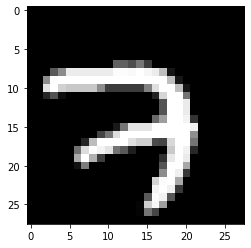

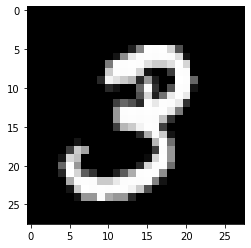

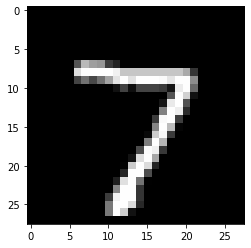

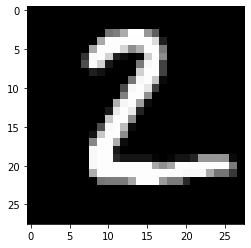

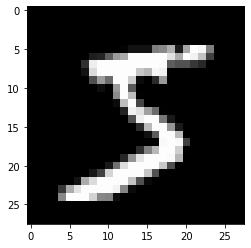

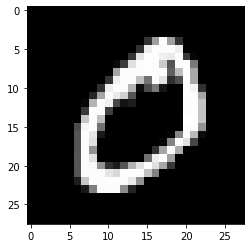

[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


In [ ]:
#TODO#
import matplotlib.pyplot as plt
first_array=images_train[0]
first_array = first_array.reshape([28, 28])
plt.gray()
plt.imshow(first_array)
plt.show()


first_array=images_train[1]
first_array = first_array.reshape([28, 28])
plt.gray()
plt.imshow(first_array)
plt.show()


first_array=images_test[0]
first_array = first_array.reshape([28, 28])
plt.gray()
plt.imshow(first_array)
plt.show()


first_array=images_test[1]
first_array = first_array.reshape([28, 28])
plt.gray()
plt.imshow(first_array)
plt.show()



first_array=images_validation[0]
first_array = first_array.reshape([28, 28])
plt.gray()
plt.imshow(first_array)
plt.show()


first_array=images_validation[1]
first_array = first_array.reshape([28, 28])
plt.gray()
plt.imshow(first_array)
plt.show()
print(labels_test[0])

### **Task4**: Implement a fully connected neural network with one hidden layer with 10 units. For optimizer, you can use tf.train.GradientDescentOptimizer, and tf.nn.softmax_cross_entropy_with_logits for the the loss function. 

For initializing network weights, you can either use tf.random_normal, or tf.zeros. Train your network, by normal initialization with mean=0, and standard deviation=[0.0 , 0.1 , 0.3 , 0.8 , 1.5 , 3], and report loss and accuracy values for each initialization and analyze your observation. Don't forget to initialize the bias variables only with tf.zeros. 

For the best initilization in terms of accuracy, add loss and accuracy value to the Tensorboard by **tf.summary.scalar**, and show the loss function and accuracy diagrams for each iteration using Tensorboard.

Finally, calculate loss and accuracy on test data, and print these values.


In [ ]:
#TODO#
import tensorflow as tf
import numpy as np
def fc_layer(x, num_units, name, standDev , use_relu=True):
    in_dim = x.get_shape()[1]
    initer = tf.truncated_normal_initializer(stddev=standDev)
    W = tf.get_variable('W_' + name,
                           dtype=tf.float32,
                           shape=[in_dim, num_units],
                           initializer=initer)


    b = tf.zeros([num_units] , dtype=tf.float32 , name = name)
    layer = tf.matmul(x, W)
    layer += b
    if use_relu:
        layer = tf.nn.relu(layer)
    return layer


def randomize(x, y):
    permutation = np.random.permutation(y.shape[0])
    shuffled_x = x[permutation, :]
    shuffled_y = y[permutation]
    return shuffled_x, shuffled_y

def get_next_batch(x, y, start, end):
    x_batch = x[start:end]
    y_batch = y[start:end]
    return x_batch, y_batch




img_size_flat = 28*28
n_classes = 10
learning_rate = 0.01
writer = tf.summary.FileWriter('./mnist')

x = tf.placeholder(tf.float32, shape=[None, img_size_flat], name='X')
y = tf.placeholder(tf.float32, shape=[None, n_classes], name='Y')
std = tf.placeholder(tf.float32, shape = [] , name='std')

fc1 = fc_layer(x, 10, 'FC1', standDev = std, use_relu=True )
output_logits = fc_layer(fc1, n_classes, 'OUT', standDev = std , use_relu=False )


cls_prediction = tf.argmax(output_logits, axis=1, name='predictions')

loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=y, logits=output_logits), name='loss')
optimizer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate, name='Grad-op').minimize(loss)
correct_prediction = tf.equal(tf.argmax(output_logits, 1), tf.argmax(y, 1), name='correct_pred')
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32), name='accuracy')

loss_summary = tf.summary.scalar(name='loss_Summary std=0.1', tensor=loss)
  
acc_summary = tf.summary.scalar(name='accuracy_Summary std=0.1', tensor=accuracy)

init = tf.global_variables_initializer()

batch_size = 100    
learning_rate = 0.01  
#[0.0 , 0.01 , 0.1 , 0.3 , 0.8 , 1.5 , 3]
for s in [0.0 , 0.1 , 0.3 , 0.8 , 1.5 , 3]:
  print('##################################################################################')
  print('s = ' + str(s))
  with tf.Session() as sess:
    sess.run(init , feed_dict={std: s})

    global_step = 0
    num_tr_iter = int(len(labels_train) / batch_size)
    for epoch in range(10):
      print('Training epoch: {}'.format(epoch + 1))
      x_train, y_train = randomize(images_train, labels_train)
      for iteration in range(num_tr_iter):
        global_step += 1
        start = iteration * batch_size
        end = (iteration + 1) * batch_size
        x_batch, y_batch = get_next_batch(x_train, y_train, start, end)

        feed_dict_batch = {x: x_batch, y: y_batch , std: s}
        sess.run(optimizer, feed_dict=feed_dict_batch)

        
      loss_batch, acc_batch = sess.run([loss, accuracy],
                                             feed_dict=feed_dict_batch)

      print("iter {0:3d}:\t Loss={1:.2f},\tTraining Accuracy={2:.01%}".
                  format(iteration, loss_batch, acc_batch))

      feed_dict_valid = {x: images_validation[:1000], y: labels_validation[:1000] , std:s}
      loss_valid, acc_valid = sess.run([loss, accuracy], feed_dict=feed_dict_valid)
      print('---------------------------------------------------------')
      print("Epoch: {0}, validation loss: {1:.2f}, validation accuracy: {2:.01%}".
          format(epoch + 1, loss_valid, acc_valid))
      print('---------------------------------------------------------')
      if s==0.1:
        summary = sess.run(loss_summary , feed_dict=feed_dict_batch)
        writer.add_summary(summary, epoch)
        summary = sess.run(acc_summary , feed_dict=feed_dict_batch)
        writer.add_summary(summary, epoch)
    print('end of s = ' + str(s))
    if s==0.1:
      test_dict = {x: images_test, y: labels_test}
      loss_test, acc_test = sess.run([loss, accuracy], feed_dict=test_dict)
      print("for std = 0.1 : test loss: {0:.2f}, test accuracy: {1:.01%}".
          format( loss_valid, acc_valid))
    print('|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||')


Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.

INFO:tensorflow:Summary name loss_Summary std=0.1 is illegal; using loss_Summary_std_0.1 instead.
INFO:tensorflow:Summary name accuracy_Summary std=0.1 is illegal; using accuracy_Summary_std_0.1 instead.
##################################################################################
s = 0.0
Training epoch: 1
iter 549:	 Loss=2.30,	Training Accuracy=7.0%
---------------------------------------------------------
Epoch: 1, validation loss: 2.30, validation accuracy: 9.7%
---------------------------------------------------------
Training epoch: 2
iter 549:	 Loss=2.30,	Training Accuracy=9.0%
---------------------------------------------------------
Epoch: 2, validation loss: 2.30, validation accuracy: 9.7%
---------------------------------------------------------
Training epoch: 3
iter 549:	 Loss=2.30

In [ ]:
!kill 2047
%load_ext tensorboard
%tensorboard --logdir mnist

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


**Answer:**

as seen above for std=0 there is almost no improvement througout the iterations. The best performanse was seen for std=0.1 and then for std=0.3 .
But after that the performance starts to get worse. This means that the weights distribution should follow one with a reasonable standard deviation. A too small std results in a weight matrix that all its entries are almost identical. Too big of a std can result in weights that are lesser consentrated around zero and thus harder to train.

Test accuracy and loss for std=0.1 are 88.5% and 0.39

### **Task5**: Repeat Task4 for a neural network with two hidden layers each 50 units, and tanh as activation function. Also, compare the two models.

In [ ]:
#TODO#
#TODO#
import tensorflow as tf
import numpy as np
def fc_layer(x, num_units, name, standDev , use_tanh=True):
    in_dim = x.get_shape()[1]
    initer = tf.truncated_normal_initializer(stddev=standDev)
    W = tf.get_variable('W_' + name,
                           dtype=tf.float32,
                           shape=[in_dim, num_units],
                           initializer=initer)


    b = tf.zeros([num_units] , dtype=tf.float32 , name = name)
    layer = tf.matmul(x, W)
    layer += b
    if use_tanh:
        layer = tf.nn.tanh(layer)
    return layer


def randomize(x, y):
    permutation = np.random.permutation(y.shape[0])
    shuffled_x = x[permutation, :]
    shuffled_y = y[permutation]
    return shuffled_x, shuffled_y

def get_next_batch(x, y, start, end):
    x_batch = x[start:end]
    y_batch = y[start:end]
    return x_batch, y_batch




img_size_flat = 28*28
n_classes = 10
learning_rate = 0.01
writer = tf.summary.FileWriter('./mnist2')

x = tf.placeholder(tf.float32, shape=[None, img_size_flat], name='X')
y = tf.placeholder(tf.float32, shape=[None, n_classes], name='Y')
std = tf.placeholder(tf.float32, shape = [] , name='std')

fc1 = fc_layer(x, 50, 'FC1', standDev = std, use_tanh=True )
fc2 = fc_layer(fc1, 50, 'FC2', standDev = std, use_tanh=True )
output_logits = fc_layer(fc2, n_classes, 'OUT', standDev = std , use_tanh=False )


cls_prediction = tf.argmax(output_logits, axis=1, name='predictions')

loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=y, logits=output_logits), name='loss')
optimizer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate, name='Grad-op').minimize(loss)
correct_prediction = tf.equal(tf.argmax(output_logits, 1), tf.argmax(y, 1), name='correct_pred')
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32), name='accuracy')

loss_summary = tf.summary.scalar(name='loss_Summary std=0.1', tensor=loss)
  
acc_summary = tf.summary.scalar(name='accuracy_Summary std=0.1', tensor=accuracy)

init = tf.global_variables_initializer()

batch_size = 100    
learning_rate = 0.01  
#[0.0 , 0.01 , 0.1 , 0.3 , 0.8 , 1.5 , 3]
for s in [0.0 , 0.1 , 0.3 , 0.8 , 1.5 , 3]:
  print('##################################################################################')
  print('s = ' + str(s))
  with tf.Session() as sess:
    sess.run(init , feed_dict={std: s})

    global_step = 0
    num_tr_iter = int(len(labels_train) / batch_size)
    for epoch in range(10):
      print('Training epoch: {}'.format(epoch + 1))
      x_train, y_train = randomize(images_train, labels_train)
      for iteration in range(num_tr_iter):
        global_step += 1
        start = iteration * batch_size
        end = (iteration + 1) * batch_size
        x_batch, y_batch = get_next_batch(x_train, y_train, start, end)

        feed_dict_batch = {x: x_batch, y: y_batch , std: s}
        sess.run(optimizer, feed_dict=feed_dict_batch)

        
      loss_batch, acc_batch = sess.run([loss, accuracy],
                                             feed_dict=feed_dict_batch)

      print("iter {0:3d}:\t Loss={1:.2f},\tTraining Accuracy={2:.01%}".
                  format(iteration, loss_batch, acc_batch))

      feed_dict_valid = {x: images_validation[:1000], y: labels_validation[:1000] , std:s}
      loss_valid, acc_valid = sess.run([loss, accuracy], feed_dict=feed_dict_valid)
      print('---------------------------------------------------------')
      print("Epoch: {0}, validation loss: {1:.2f}, validation accuracy: {2:.01%}".
          format(epoch + 1, loss_valid, acc_valid))
      print('---------------------------------------------------------')
      if s==0.1:
        summary = sess.run(loss_summary , feed_dict=feed_dict_batch)
        writer.add_summary(summary, epoch)
        summary = sess.run(acc_summary , feed_dict=feed_dict_batch)
        writer.add_summary(summary, epoch)
    print('end of s = ' + str(s))
    if s==0.1:
      test_dict = {x: images_test, y: labels_test}
      loss_test, acc_test = sess.run([loss, accuracy], feed_dict=test_dict)
      print("for std = 0.1 : test loss: {0:.2f}, test accuracy: {1:.01%}".
          format( loss_valid, acc_valid))
    print('|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||')


Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.

INFO:tensorflow:Summary name loss_Summary std=0.1 is illegal; using loss_Summary_std_0.1 instead.
INFO:tensorflow:Summary name accuracy_Summary std=0.1 is illegal; using accuracy_Summary_std_0.1 instead.
##################################################################################
s = 0.0
Training epoch: 1
iter 549:	 Loss=2.30,	Training Accuracy=7.0%
---------------------------------------------------------
Epoch: 1, validation loss: 2.30, validation accuracy: 9.7%
---------------------------------------------------------
Training epoch: 2
iter 549:	 Loss=2.30,	Training Accuracy=9.0%
---------------------------------------------------------
Epoch: 2, validation loss: 2.30, validation accuracy: 9.7%
---------------------------------------------------------
Training epoch: 3
iter 549:	 Loss=2.30

In [ ]:
%load_ext tensorboard
%tensorboard --logdir mnist2

Reusing TensorBoard on port 6007 (pid 3375), started 0:09:16 ago. (Use '!kill 3375' to kill it.)

**Answer:**

Here we see better results for every value of standard deviation. This is because our network contains more layers and more neurons in each layer.

Once again the best answer is achieved in std=0.1 with a test loss equal to 0.33 and accuracy of 90.6%.

# Part2: In this part, you become familiar with Keras, and implementing CNNs through a calssification task on CIFAR-10 dataset.

## Import essential libraries

In [ ]:
import numpy as np

import matplotlib.pyplot as plt

import keras
from keras import datasets
from keras import layers
from keras import optimizers
from keras import losses

import os

Using TensorFlow backend.


## Load CIFAR-10 dataset

In [ ]:
# Reading data.
cifar10 = datasets.cifar10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Scaling.
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255

# One hot encoding.
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

170500096/170498071 [==============================] - 6s 0us/step


In [ ]:
# checking the shape of train and test data.
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(50000, 10)
(10000, 32, 32, 3)
(10000, 10)


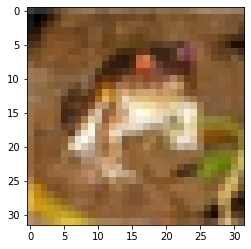

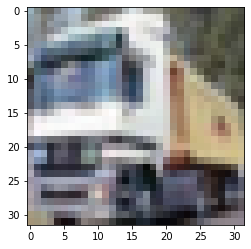

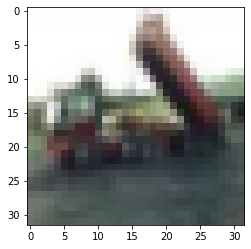

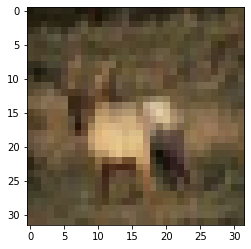

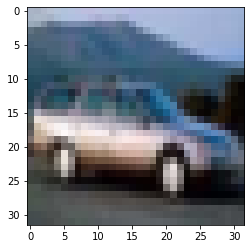

...

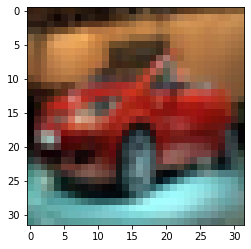

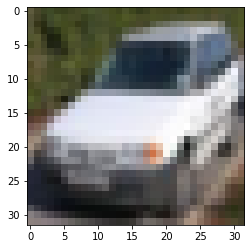

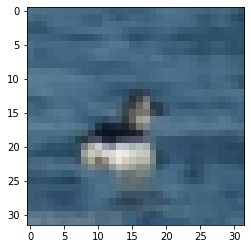

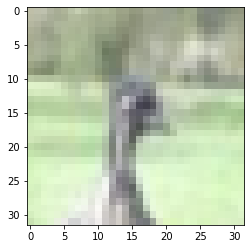

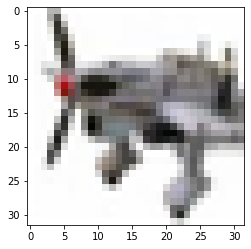

In [ ]:
# Ploting some images.
for i in range(50):
  imgplot = plt.imshow(X_train[i].reshape(32, 32, 3))
  plt.show()

## Model definition

In [ ]:
input_shape = X_train.shape[1:]
num_classes = 10

### **Task1:** Complete the model according to this architecture!

*   Conv2D, 64 filters, (3, 3) kernel, strides = 1
*   Conv2D, 64 filters, (3, 3) kernel, strides = 1
*   MaxPooling2D, (2, 2) poolsize
*   Dropout, droprate = 0.25
*   Conv2D, 128 filters, (3, 3) kernel, strides = 1
*   Conv2D, 128 filters, (3, 3) kernel, strides = 1
*   MaxPooling2D, (2, 2) poolsize
*   Dropout, droprate = 0.25
*   Flatten
*   Dense, 1024 nodes
*   Dropout, droprate = 0.5
*   Dense, 10 nodes

Note: Please use 'same' padding in all Conv layers, use relu as an activation function in all layers (except the last layer, which you need softmax!), use bias in all layers, and also use 'glorot_uniform' initializer in all layers.

In [ ]:
# Model.

model = keras.models.Sequential()

##TODO##
model.add(layers.Conv2D(64, (3, 3), strides=1 , padding="same", activation="relu" , kernel_initializer='glorot_uniform'))
model.add(layers.Conv2D(64, (3, 3), strides=1 , padding="same", activation="relu" , kernel_initializer='glorot_uniform'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Dropout(0.25))
model.add(layers.Conv2D(128, (3, 3), strides=1 , padding="same", activation="relu" , kernel_initializer='glorot_uniform'))
model.add(layers.Conv2D(128, (3, 3), strides=1 , padding="same", activation="relu" , kernel_initializer='glorot_uniform'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Dropout(0.25))
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.25))

model.add(layers.Dense(num_classes, activation='softmax'))

In [ ]:
# You can see a summary of the structure and parameters of your model here.
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 128)       147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 128)        

## Defining Loss and Optimizer 

In [ ]:
# Optimizer.
learning_rate = 0.0001
opt = optimizers.Adam(lr=learning_rate, decay=1e-6)

# Loss.
ce = losses.categorical_crossentropy

# Compile.
model.compile(optimizer=opt, loss=ce, metrics=['accuracy'])

## Training

### **Task2**: Train your model and choose the best value for the epochs variable, then explain your reasons (you can use the plot below).

Also, answer these questions: 

1.Why is your accuracy on train data, sometimes lower than accuracy on the test?<br/>
2.What are the benefits of callback?

**Answer :**

We choose 10 epochs because as seen in the plots below, it gives the least amount of loss for the validation data and any more epochs don't make any significant difference in the accuracy, despite higher loss.

Accuracy on the train data can be lower than the validation data in small epochs because of underfitting in train data that causes lesser accuracy in the train data.

Callbacks can be used in keras in order to save and take note of some important information during the iterations. For example callbacks can be used to creats logs of variables or to create summaries for graphs in tensorboard.

In [ ]:
# Train.
batch_size = 32
epochs = 10 #10 epochs is the best

history = model.fit(x=X_train, y=y_train, batch_size=batch_size, epochs=epochs, verbose=1,
                    callbacks=None, validation_split=0.1, shuffle=True)





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Train on 45000 samples, validate on 5000 samples
Epoch 1/10





45000/45000 [==============================] - 25s 549us/step - loss: 1.5721 - acc: 0.4288 - val_loss: 1.2672 - val_acc: 0.5468
Epoch 2/10
45000/45000 [==============================] - 21s 463us/step - loss: 1.1770 - acc: 0.5833 - val_loss: 1.0514 - val_acc: 0.6290
Epoch 3/10
45000/45000 [==============================] - 21s 463us/step - loss: 0.9995 - acc: 0.6484 - val_loss: 0.9011 - val_acc: 0.6870
Epoch 4/10
45000/45000 [==============================] - 21s 464us/step - loss: 0.8719 - acc: 0.6950 - val_loss: 0.8054 - val_acc: 0.7240
Epoch 5/10
45000/45000 [==============================] - 21s 465us/step - loss: 0.7727 - acc: 0.7287 - val_loss: 0.7466 - val_acc: 0.7462
Epoch 6/10
45000/45000 [==========

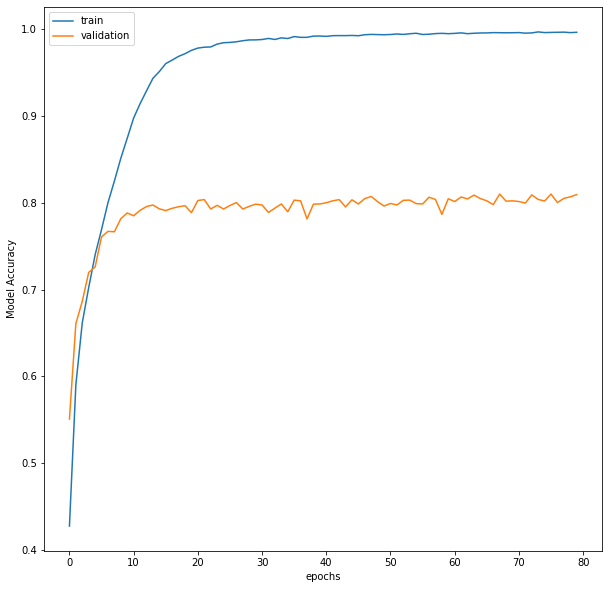

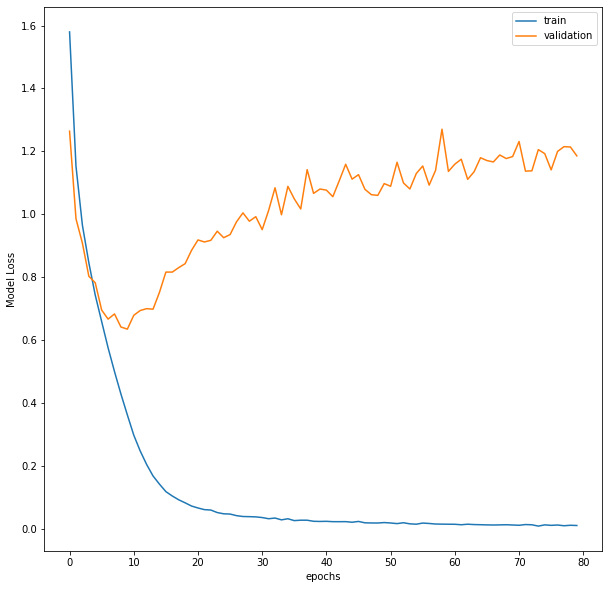

In [ ]:
# You can plot the accuracy as well as loss of the model on both train data and validation data.
def plot_history(history):
    
    plt.figure(figsize=(10, 10))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.xlabel('epochs'), plt.ylabel('Model Accuracy')
    plt.legend(), plt.show()
    
    plt.figure(figsize=(10, 10))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.xlabel('epochs'), plt.ylabel('Model Loss')
    plt.legend(), plt.show()
    
plot_history(history)

## Evaluating your model

In [ ]:
# Scores.

#history = model.fit(x=X_train, y=y_train, batch_size=batch_size, epochs=10, verbose=1,
                    #callbacks=None, validation_split=0.1, shuffle=True)
scores = model.evaluate(X_test, y_test, verbose=1)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

10000/10000 [==============================] - 1s 120us/step
Test loss: 0.6730048197746277
Test accuracy: 0.7763


In [ ]:
# Save model and weights.
model_path = './'
model.save(model_path)

OSError: ignored

### **Task3**: We have several methods such as batch normalization, kernel regularization, Data augmentation, Label smoothing and also dropout for improving your test accuracy. Shortly describe these methods, and exploit some of them to obtain at least 5% higher accuracy.
if you can get more than 90% accuracy, it will have extra points. (for both of them, you are free to change the architecture or other things!)

Note that you should reach at least 85% of accuracy on your test data to receive full grade for this part.


**Answer:**

1. Batch Normalization: normalizing the input layer by adjusting and scaling the activations.
2. Kernel Regularization: Tries to reduce the weights W (excluding bias)
3. Data augmentation: enables practitioners to significantly increase the diversity of data available for training models, without actually collecting new data by creating new data from the existing ones.
4. Label smoothing: regularization technique for classification problems to prevent the model from predicting the labels too confidently during training and generalizing poorly.
5. Dropout: regularization technique patented by Google for reducing overfitting in neural networks by preventing complex co-adaptations on training data. The term "dropout" refers to dropping out units in a neural network.

In [ ]:
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras import regularizers

weight_decay = 1e-4
model = keras.models.Sequential()
model.add(Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay), input_shape=X_train.shape[1:]))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
 
model.add(Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.3))
 
model.add(Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.4))
 
model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))


batch_size = 64
 
opt_rms = keras.optimizers.rmsprop(lr=0.001,decay=1e-6)
model.compile(loss='categorical_crossentropy', optimizer=opt_rms, metrics=['accuracy'])


history = model.fit(x=X_train, y=y_train, batch_size=batch_size, epochs=100, verbose=1,
                    callbacks=None, validation_split=0.1, shuffle=True)

scores = model.evaluate(X_test, y_test, batch_size=128, verbose=1)
print('\nTest result: %.3f loss: %.3f' % (scores[1]*100,scores[0]) )                                                             














Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 45000 samples, validate on 5000 samples
Epoch 1/100
45000/45000 [==============================] - 13s 283us/step - loss: 1.7721 - acc: 0.4709 - val_loss: 1.3179 - val_acc: 0.5964
Epoch 2/100
45000/45000 [==============================] - 10s 214us/step - loss: 1.1255 - acc: 0.6397 - val_loss: 1.1012 - val_acc: 0.6476
Epoch 3/100
45000/45000 [==============================] - 9s 208us/step - loss: 0.9414 - acc: 0.7012 - val_loss: 0.9807 - val_acc: 0.6890
Epoch 4/100
45000/45000 [==============================] - 9s 209us/step - loss: 0.8341 - acc: 0.7381 - val_loss: 0.8538 - val_acc: 0.7388
Epoch 5/100
45000/45000 [==============================] - 9s 208us/step - loss: 0.7636 - acc: 0.7664 - val_loss: 0.9638 - val_acc: 0.7202
Epoch 6/100
45000/45000 [====

We reach an accuracy of 86% and loss of 0.673

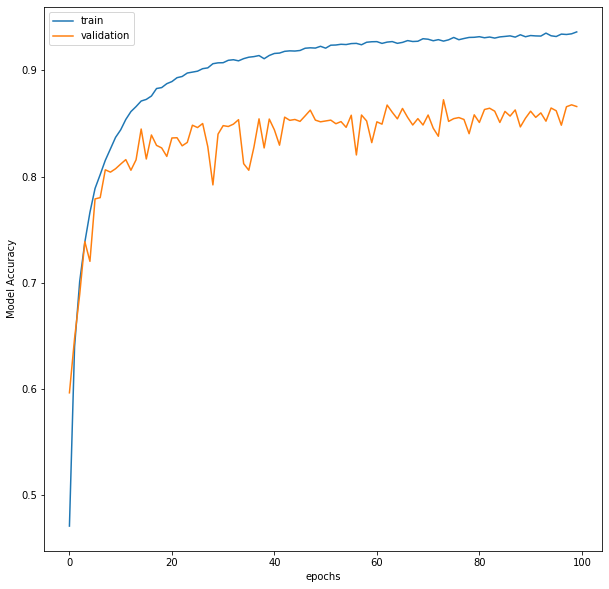

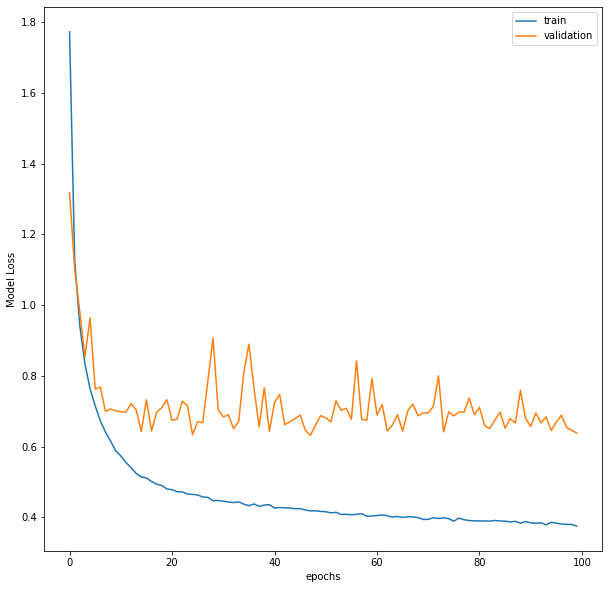

In [ ]:
# You can plot the accuracy as well as loss of the model on both train data and validation data.
def plot_history(history):
    
    plt.figure(figsize=(10, 10))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.xlabel('epochs'), plt.ylabel('Model Accuracy')
    plt.legend(), plt.show()
    
    plt.figure(figsize=(10, 10))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.xlabel('epochs'), plt.ylabel('Model Loss')
    plt.legend(), plt.show()
    
plot_history(history)